In [1]:
import pandas as pd
import numpy as np

In [2]:
df=pd.read_csv("musk_csv.csv")

In [3]:
df.head()

,ID,molecule_name,conformation_name,f1,f2,f3,f4,f5,f6,f7,...,f158,f159,f160,f161,f162,f163,f164,f165,f166,class
0,1,MUSK-211,211_1+1,46,-108,-60,-69,-117,49,38,...,-308,52,-7,39,126,156,-50,-112,96,1
1,2,MUSK-211,211_1+10,41,-188,-145,22,-117,-6,57,...,-59,-2,52,103,136,169,-61,-136,79,1
2,3,MUSK-211,211_1+11,46,-194,-145,28,-117,73,57,...,-134,-154,57,143,142,165,-67,-145,39,1
3,4,MUSK-211,211_1+12,41,-188,-145,22,-117,-7,57,...,-60,-4,52,104,136,168,-60,-135,80,1
4,5,MUSK-211,211_1+13,41,-188,-145,22,-117,-7,57,...,-60,-4,52,104,137,168,-60,-135,80,1


In [4]:
import pandas_profiling

In [5]:
df.profile_report(style={'full_width':True})

In [6]:
corr_matrix=df.corr().abs()

In [7]:
upper=corr_matrix.where(np.triu(np.ones(corr_matrix.shape),k=1).astype(np.bool))

In [8]:
todrop=[column for column in upper.columns if any(upper[column]>0.9)]

In [9]:
df=df.drop(df[todrop],axis=1)

In [10]:
df.head()

,ID,molecule_name,conformation_name,f1,f2,f3,f4,f5,f6,f7,...,f157,f158,f160,f161,f162,f163,f164,f165,f166,class
0,1,MUSK-211,211_1+1,46,-108,-60,-69,-117,49,38,...,-244,-308,-7,39,126,156,-50,-112,96,1
1,2,MUSK-211,211_1+10,41,-188,-145,22,-117,-6,57,...,-235,-59,52,103,136,169,-61,-136,79,1
2,3,MUSK-211,211_1+11,46,-194,-145,28,-117,73,57,...,-238,-134,57,143,142,165,-67,-145,39,1
3,4,MUSK-211,211_1+12,41,-188,-145,22,-117,-7,57,...,-236,-60,52,104,136,168,-60,-135,80,1
4,5,MUSK-211,211_1+13,41,-188,-145,22,-117,-7,57,...,-236,-60,52,104,137,168,-60,-135,80,1


In [11]:
df=df.drop(columns=['ID','molecule_name','conformation_name'])

In [12]:
df.head()

,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,...,f157,f158,f160,f161,f162,f163,f164,f165,f166,class
0,46,-108,-60,-69,-117,49,38,-161,-8,5,...,-244,-308,-7,39,126,156,-50,-112,96,1
1,41,-188,-145,22,-117,-6,57,-171,-39,-100,...,-235,-59,52,103,136,169,-61,-136,79,1
2,46,-194,-145,28,-117,73,57,-168,-39,-22,...,-238,-134,57,143,142,165,-67,-145,39,1
3,41,-188,-145,22,-117,-7,57,-170,-39,-99,...,-236,-60,52,104,136,168,-60,-135,80,1
4,41,-188,-145,22,-117,-7,57,-170,-39,-99,...,-236,-60,52,104,137,168,-60,-135,80,1


In [13]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 6598 entries, 0 to 6597
Columns: 108 entries, f1 to class
dtypes: int64(108)
memory usage: 5.4 MB


In [35]:
from keras.utils import to_categorical
from keras.models import Sequential
from keras.layers import Dense,Dropout
from keras.callbacks import ReduceLROnPlateau,EarlyStopping

In [15]:
y=df['class']

In [16]:
df=df.drop(columns=['class'])

In [17]:
df.head()

,f1,f2,f3,f4,f5,f6,f7,f8,f9,f10,...,f156,f157,f158,f160,f161,f162,f163,f164,f165,f166
0,46,-108,-60,-69,-117,49,38,-161,-8,5,...,3,-244,-308,-7,39,126,156,-50,-112,96
1,41,-188,-145,22,-117,-6,57,-171,-39,-100,...,-5,-235,-59,52,103,136,169,-61,-136,79
2,46,-194,-145,28,-117,73,57,-168,-39,-22,...,-163,-238,-134,57,143,142,165,-67,-145,39
3,41,-188,-145,22,-117,-7,57,-170,-39,-99,...,-7,-236,-60,52,104,136,168,-60,-135,80
4,41,-188,-145,22,-117,-7,57,-170,-39,-99,...,-8,-236,-60,52,104,137,168,-60,-135,80


In [18]:
y.head()

0    1
1    1
2    1
3    1
4    1
Name: class, dtype: int64

In [19]:
y=to_categorical(y,2)

In [20]:
from sklearn.model_selection import train_test_split

In [21]:
X_train, X_test, y_train, y_test = train_test_split(
     df, y, test_size=0.2, random_state=42)

In [92]:
from keras import backend as K

In [100]:
def recall_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        possible_positives = K.sum(K.round(K.clip(y_true, 0, 1)))
        recall = true_positives / (possible_positives + K.epsilon())
        return recall

def precision_m(y_true, y_pred):
        true_positives = K.sum(K.round(K.clip(y_true * y_pred, 0, 1)))
        predicted_positives = K.sum(K.round(K.clip(y_pred, 0, 1)))
        precision = true_positives / (predicted_positives + K.epsilon())
        return precision

def f1_m(y_true, y_pred):
    precision = precision_m(y_true, y_pred)
    recall = recall_m(y_true, y_pred)
    return 2*((precision*recall)/(precision+recall+K.epsilon()))



In [125]:
model=Sequential()
model.add(Dense(200,input_dim=df.shape[1],activation='relu'))
model.add(Dense(200,activation='relu'))
model.add(Dense(100,activation='relu'))
model.add(Dense(50,activation='relu'))
model.add(Dense(20,activation='relu'))
model.add(Dense(10,activation='relu'))
model.add(Dense(2,activation='softmax'))

In [126]:
model.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy',f1_m,precision_m, recall_m])

In [127]:
from imblearn.keras import BalancedBatchGenerator

In [128]:
training_generator=BalancedBatchGenerator(X_train,y_train,batch_size=50,random_state=40)

In [129]:
callback=[ReduceLROnPlateau(patience=3)]

In [130]:
history=model.fit_generator(generator=training_generator,callbacks=callback,epochs=50,validation_data=(X_test,y_test))

Epoch 1/50
32/32 [==============================] - 1s 16ms/step - loss: 0.7376 - accuracy: 0.7563 - f1_m: 0.7562 - precision_m: 0.7562 - recall_m: 0.7562 - val_loss: 0.5217 - val_accuracy: 0.7788 - val_f1_m: 0.7781 - val_precision_m: 0.7781 - val_recall_m: 0.7781
Epoch 2/50
32/32 [==============================] - 0s 5ms/step - loss: 0.2437 - accuracy: 0.9106 - f1_m: 0.9106 - precision_m: 0.9106 - recall_m: 0.9106 - val_loss: 0.2585 - val_accuracy: 0.8977 - val_f1_m: 0.8956 - val_precision_m: 0.8956 - val_recall_m: 0.8956
Epoch 3/50
32/32 [==============================] - 0s 5ms/step - loss: 0.1545 - accuracy: 0.9325 - f1_m: 0.9325 - precision_m: 0.9325 - recall_m: 0.9325 - val_loss: 0.2626 - val_accuracy: 0.9061 - val_f1_m: 0.9059 - val_precision_m: 0.9059 - val_recall_m: 0.9059
Epoch 4/50
32/32 [==============================] - 0s 5ms/step - loss: 0.1242 - accuracy: 0.9544 - f1_m: 0.9544 - precision_m: 0.9544 - recall_m: 0.9544 - val_loss: 0.2431 - val_accuracy: 0.9174 - val_f1_m:

Epoch 32/50
32/32 [==============================] - 0s 5ms/step - loss: 0.0051 - accuracy: 1.0000 - f1_m: 1.0000 - precision_m: 1.0000 - recall_m: 1.0000 - val_loss: 0.1612 - val_accuracy: 0.9561 - val_f1_m: 0.9570 - val_precision_m: 0.9570 - val_recall_m: 0.9570
Epoch 33/50
32/32 [==============================] - 0s 7ms/step - loss: 0.0051 - accuracy: 1.0000 - f1_m: 1.0000 - precision_m: 1.0000 - recall_m: 1.0000 - val_loss: 0.1612 - val_accuracy: 0.9561 - val_f1_m: 0.9570 - val_precision_m: 0.9570 - val_recall_m: 0.9570
Epoch 34/50
32/32 [==============================] - 0s 6ms/step - loss: 0.0051 - accuracy: 1.0000 - f1_m: 1.0000 - precision_m: 1.0000 - recall_m: 1.0000 - val_loss: 0.1612 - val_accuracy: 0.9561 - val_f1_m: 0.9570 - val_precision_m: 0.9570 - val_recall_m: 0.9570
Epoch 35/50
32/32 [==============================] - 0s 5ms/step - loss: 0.0051 - accuracy: 1.0000 - f1_m: 1.0000 - precision_m: 1.0000 - recall_m: 1.0000 - val_loss: 0.1612 - val_accuracy: 0.9561 - val_f1

In [131]:
from keras import regularizers

In [132]:
model2=Sequential()
model2.add(Dense(200,input_dim=df.shape[1],activation='relu'))
model2.add(Dense(200,activation='relu',kernel_regularizer=regularizers.l2(0.05)))
model2.add(Dense(100,activation='relu',kernel_regularizer=regularizers.l2(0.05)))
model2.add(Dense(50,activation='relu',kernel_regularizer=regularizers.l2(0.05)))
model2.add(Dense(20,activation='relu',kernel_regularizer=regularizers.l2(0.05)))
model2.add(Dense(10,activation='relu',kernel_regularizer=regularizers.l2(0.05)))
model2.add(Dense(2,activation='softmax'))

In [133]:
model2.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy',f1_m,precision_m, recall_m])

In [134]:
callback=[ReduceLROnPlateau(patience=3)]

In [135]:
from keras import regularizers

In [136]:
history2=model2.fit_generator(generator=training_generator,callbacks=callback,epochs=50,validation_data=(X_test,y_test))

Epoch 1/50
32/32 [==============================] - 1s 17ms/step - loss: 21.2458 - accuracy: 0.7750 - f1_m: 0.7750 - precision_m: 0.7750 - recall_m: 0.7750 - val_loss: 18.1213 - val_accuracy: 0.8705 - val_f1_m: 0.8700 - val_precision_m: 0.8700 - val_recall_m: 0.8700
Epoch 2/50
32/32 [==============================] - 0s 4ms/step - loss: 16.3931 - accuracy: 0.8875 - f1_m: 0.8875 - precision_m: 0.8875 - recall_m: 0.8875 - val_loss: 14.6581 - val_accuracy: 0.9265 - val_f1_m: 0.9281 - val_precision_m: 0.9281 - val_recall_m: 0.9281
Epoch 3/50
32/32 [==============================] - 0s 6ms/step - loss: 13.4745 - accuracy: 0.8988 - f1_m: 0.8987 - precision_m: 0.8987 - recall_m: 0.8987 - val_loss: 12.2655 - val_accuracy: 0.9023 - val_f1_m: 0.9044 - val_precision_m: 0.9044 - val_recall_m: 0.9044
Epoch 4/50
32/32 [==============================] - 0s 5ms/step - loss: 11.2349 - accuracy: 0.9256 - f1_m: 0.9256 - precision_m: 0.9256 - recall_m: 0.9256 - val_loss: 10.2854 - val_accuracy: 0.9439 - v

Epoch 32/50
32/32 [==============================] - 0s 5ms/step - loss: 0.7987 - accuracy: 0.9987 - f1_m: 0.9987 - precision_m: 0.9987 - recall_m: 0.9987 - val_loss: 0.8612 - val_accuracy: 0.9652 - val_f1_m: 0.9659 - val_precision_m: 0.9659 - val_recall_m: 0.9659
Epoch 33/50
32/32 [==============================] - 0s 6ms/step - loss: 0.7534 - accuracy: 0.9981 - f1_m: 0.9981 - precision_m: 0.9981 - recall_m: 0.9981 - val_loss: 0.8614 - val_accuracy: 0.9455 - val_f1_m: 0.9467 - val_precision_m: 0.9467 - val_recall_m: 0.9467
Epoch 34/50
32/32 [==============================] - ETA: 0s - loss: 0.7127 - accuracy: 1.0000 - f1_m: 1.0000 - precision_m: 1.0000 - recall_m: 1.00 - 0s 5ms/step - loss: 0.7091 - accuracy: 1.0000 - f1_m: 1.0000 - precision_m: 1.0000 - recall_m: 1.0000 - val_loss: 0.7554 - val_accuracy: 0.9689 - val_f1_m: 0.9696 - val_precision_m: 0.9696 - val_recall_m: 0.9696
Epoch 35/50
32/32 [==============================] - 0s 5ms/step - loss: 0.7143 - accuracy: 0.9775 - f1_m: 

In [137]:
model3=Sequential()
model3.add(Dense(200,input_dim=df.shape[1],activation='relu'))
model3.add(Dense(200,activation='relu',kernel_regularizer=regularizers.l2(0.05)))
model3.add(Dense(100,activation='relu',kernel_regularizer=regularizers.l2(0.05)))
model3.add(Dense(50,activation='relu',kernel_regularizer=regularizers.l2(0.05)))
model3.add(Dense(20,activation='relu',kernel_regularizer=regularizers.l2(0.05)))
model3.add(Dense(10,activation='relu',kernel_regularizer=regularizers.l2(0.05)))
model3.add(Dense(2,activation='softmax'))

In [138]:
model3.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy',f1_m,precision_m, recall_m])

In [139]:
from imblearn.under_sampling import NearMiss

In [140]:
training_generator=BalancedBatchGenerator(X_train,y_train,sampler=NearMiss(),batch_size=50,random_state=40)

In [141]:
history3=model3.fit_generator(generator=training_generator,callbacks=callback,epochs=50,validation_data=(X_test,y_test))

Epoch 1/50
32/32 [==============================] - 1s 18ms/step - loss: 20.3643 - accuracy: 0.6850 - f1_m: 0.6850 - precision_m: 0.6850 - recall_m: 0.6850 - val_loss: 18.7343 - val_accuracy: 0.7136 - val_f1_m: 0.7133 - val_precision_m: 0.7133 - val_recall_m: 0.7133
Epoch 2/50
32/32 [==============================] - 0s 5ms/step - loss: 14.9789 - accuracy: 0.8000 - f1_m: 0.8000 - precision_m: 0.8000 - recall_m: 0.8000 - val_loss: 13.8699 - val_accuracy: 0.7371 - val_f1_m: 0.7363 - val_precision_m: 0.7363 - val_recall_m: 0.7363
Epoch 3/50
32/32 [==============================] - 0s 8ms/step - loss: 11.2857 - accuracy: 0.8456 - f1_m: 0.8456 - precision_m: 0.8456 - recall_m: 0.8456 - val_loss: 10.6176 - val_accuracy: 0.7015 - val_f1_m: 0.7026 - val_precision_m: 0.7026 - val_recall_m: 0.7026
Epoch 4/50
32/32 [==============================] - 0s 6ms/step - loss: 8.7225 - accuracy: 0.8750 - f1_m: 0.8750 - precision_m: 0.8750 - recall_m: 0.8750 - val_loss: 8.7581 - val_accuracy: 0.6591 - val

Epoch 32/50
32/32 [==============================] - 0s 5ms/step - loss: 0.4179 - accuracy: 0.9994 - f1_m: 0.9994 - precision_m: 0.9994 - recall_m: 0.9994 - val_loss: 1.6422 - val_accuracy: 0.7379 - val_f1_m: 0.7404 - val_precision_m: 0.7404 - val_recall_m: 0.7404
Epoch 33/50
32/32 [==============================] - 0s 5ms/step - loss: 0.4175 - accuracy: 0.9994 - f1_m: 0.9994 - precision_m: 0.9994 - recall_m: 0.9994 - val_loss: 1.6485 - val_accuracy: 0.7348 - val_f1_m: 0.7374 - val_precision_m: 0.7374 - val_recall_m: 0.7374
Epoch 34/50
32/32 [==============================] - 0s 6ms/step - loss: 0.4172 - accuracy: 0.9994 - f1_m: 0.9994 - precision_m: 0.9994 - recall_m: 0.9994 - val_loss: 1.6474 - val_accuracy: 0.7348 - val_f1_m: 0.7374 - val_precision_m: 0.7374 - val_recall_m: 0.7374
Epoch 35/50
32/32 [==============================] - 0s 7ms/step - loss: 0.4171 - accuracy: 0.9994 - f1_m: 0.9994 - precision_m: 0.9994 - recall_m: 0.9994 - val_loss: 1.6458 - val_accuracy: 0.7371 - val_f1

In [142]:
model4=Sequential()
model4.add(Dense(200,input_dim=df.shape[1],activation='relu'))
model4.add(Dense(200,activation='relu',kernel_regularizer=regularizers.l2(0.05)))
model4.add(Dense(100,activation='relu',kernel_regularizer=regularizers.l2(0.05)))
model4.add(Dense(50,activation='relu',kernel_regularizer=regularizers.l2(0.05)))
model4.add(Dense(20,activation='relu',kernel_regularizer=regularizers.l2(0.05)))
model4.add(Dense(10,activation='relu',kernel_regularizer=regularizers.l2(0.05)))
model4.add(Dense(2,activation='softmax'))

In [143]:
model4.compile(optimizer='adam',loss='binary_crossentropy',metrics=['accuracy',f1_m,precision_m, recall_m])

In [144]:
history4=model4.fit_generator(generator=training_generator,callbacks=callback,epochs=50,validation_data=(X_test,y_test))

Epoch 1/50
32/32 [==============================] - 0s 16ms/step - loss: 26.4158 - accuracy: 0.4994 - f1_m: 0.4994 - precision_m: 0.4994 - recall_m: 0.4994 - val_loss: 28.5172 - val_accuracy: 0.1583 - val_f1_m: 0.1570 - val_precision_m: 0.1570 - val_recall_m: 0.1570
Epoch 2/50
32/32 [==============================] - 0s 5ms/step - loss: 20.9218 - accuracy: 0.4994 - f1_m: 0.4994 - precision_m: 0.4994 - recall_m: 0.4994 - val_loss: 24.0269 - val_accuracy: 0.1583 - val_f1_m: 0.1570 - val_precision_m: 0.1570 - val_recall_m: 0.1570
Epoch 3/50
32/32 [==============================] - 0s 6ms/step - loss: 17.2999 - accuracy: 0.4994 - f1_m: 0.4994 - precision_m: 0.4994 - recall_m: 0.4994 - val_loss: 21.1882 - val_accuracy: 0.1583 - val_f1_m: 0.1570 - val_precision_m: 0.1570 - val_recall_m: 0.1570
Epoch 4/50
32/32 [==============================] - 0s 7ms/step - loss: 14.9819 - accuracy: 0.4994 - f1_m: 0.4994 - precision_m: 0.4994 - recall_m: 0.4994 - val_loss: 19.3297 - val_accuracy: 0.1583 - v

Epoch 32/50
32/32 [==============================] - 0s 5ms/step - loss: 0.7081 - accuracy: 0.9781 - f1_m: 0.9781 - precision_m: 0.9781 - recall_m: 0.9781 - val_loss: 1.6333 - val_accuracy: 0.7159 - val_f1_m: 0.7144 - val_precision_m: 0.7144 - val_recall_m: 0.7144
Epoch 33/50
32/32 [==============================] - 0s 9ms/step - loss: 0.7081 - accuracy: 0.9781 - f1_m: 0.9781 - precision_m: 0.9781 - recall_m: 0.9781 - val_loss: 1.6333 - val_accuracy: 0.7159 - val_f1_m: 0.7144 - val_precision_m: 0.7144 - val_recall_m: 0.7144
Epoch 34/50
32/32 [==============================] - 0s 6ms/step - loss: 0.7081 - accuracy: 0.9781 - f1_m: 0.9781 - precision_m: 0.9781 - recall_m: 0.9781 - val_loss: 1.6333 - val_accuracy: 0.7159 - val_f1_m: 0.7144 - val_precision_m: 0.7144 - val_recall_m: 0.7144
Epoch 35/50
32/32 [==============================] - 0s 6ms/step - loss: 0.7081 - accuracy: 0.9781 - f1_m: 0.9781 - precision_m: 0.9781 - recall_m: 0.9781 - val_loss: 1.6333 - val_accuracy: 0.7159 - val_f1

# So,the best model is second

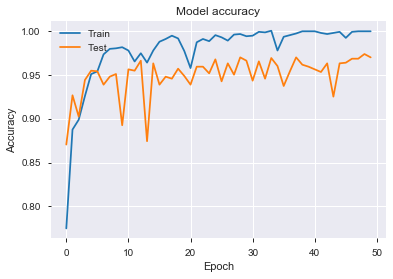

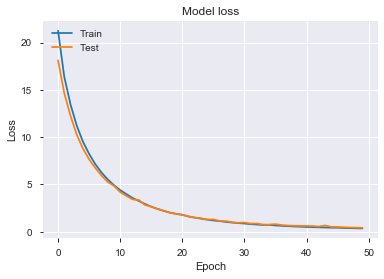

In [147]:
import matplotlib.pyplot as plt

plt.plot(history2.history['accuracy'])
plt.plot(history2.history['val_accuracy'])
plt.title('Model accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

plt.plot(history2.history['loss'])
plt.plot(history2.history['val_loss'])
plt.title('Model loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(['Train', 'Test'], loc='upper left')
plt.show()

In [148]:
# Save the weights
model2.save_weights('model_weights.h5')

# Save the model architecture
with open('model_architecture.json', 'w') as f:
    f.write(model2.to_json())